In [81]:
from sqlalchemy import create_engine, inspect, NVARCHAR, INTEGER, DATE, \
                       BOOLEAN, FLOAT, TIMESTAMP, TEXT, BIGINT, VARCHAR, NUMERIC, \
                       DATETIME
import pandas as pd
import numpy as np
import os
import plotly.express as px
import plotly.graph_objects as go
import re
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)


In [7]:
import pkg_resources
dists = sorted([str(d).lower() for d in pkg_resources.working_set])
for dist in dists:
    print(dist)

absl-py 0.11.0
adal 1.0.2
alabaster 0.7.12
ansiwrap 0.8.4
anyio 2.2.0
appdirs 1.4.4
argon2-cffi 20.1.0
asgiref 3.3.1
asn1crypto 0.24.0
astor 0.6.2
astunparse 1.6.3
async-generator 1.10
atari-py 0.2.6
attention 3.0
attrs 20.3.0
awscli 1.16.12
azure-common 1.1.27
azure-mgmt-cosmosdb 0.16.0
babel 2.9.0
backcall 0.1.0
bashutils 0.0.4
bayesian-optimization 1.2.0
black 21.7b0
bleach 1.5.0
blis 0.7.4
bokeh 2.3.0
boto 2.49.0
boto3 1.9.2
botocore 1.12.2
bottleneck 1.3.2
brotli 1.0.9
bz2file 0.98
cachetools 2.1.0
catalogue 2.0.4
catboost 0.24.4
category-encoders 1.3.0
certifi 2018.8.24
cffi 1.11.5
chardet 3.0.4
click 7.1.2
clipper-admin 0.3.0
cloudpickle 1.6.0
cma 2.6.0
colorama 0.3.9
configargparse 1.5.2
contextvars 2.4
convertdate 2.3.2
cornac 1.13.5
coverage 4.5.2
cryptography 2.3.1
cycler 0.10.0
cymem 2.0.5
cython 0.29.24
dash 1.19.0
dash-core-components 1.15.0
dash-html-components 1.1.2
dash-renderer 1.9.0
dash-table 4.11.2
dask 2021.3.0
dataclasses 0.8
datadog 0.24.0
deap 1.3.1
decorator 4

In [57]:
def get_table_from_db(table_name,select="",query="",database="ava_bi_sources",
                      host_ip="52.215.154.159",port_number="1433",user_name="SmartBid",
                      password="GBd$$7014"):
    db =  database
    host = host_ip
    port = port_number
    user =  user_name
    password =  password
    conn_string = 'mssql+pymssql://' + user + ':' + password + '@' + host + ':' + port + '/' + db
    engine = create_engine(conn_string)
    table = table_name
    df = pd.read_sql(f"select "+select+" * from dbo."+table+query,
                     con=conn_string)
    return df

In [58]:
db =  "ava_bi_sources"
host =  "52.215.154.159"
port = "1433"
user =  "SmartBid"
password = "GBd$$7014"

In [59]:

db =  "ava_bi_sources"
host =  "52.215.154.159"
port = "1433"
user =  "SmartBid"
password =  "GBd$$7014"
query = " with(nolock);"
select = "top(100000)"
tables = ["ltv_top_10","ltv_lower_90","ltv_vip_classification"]
# table = "ltv_top_10"#"ltv_vip_classification"#"ltv_dynamic_prediction"#ltv_10_precent
i = 0
key = "customer_id"
for table in tables:
    df_from_sql = get_table_from_db(table_name=table,select=select,
                                    query=query,database=db,host_ip=host,
                                    port_number=port,user_name=user,
                                    password=password)
    if i==0:
        df = df_from_sql
    else:
        
        df = df.join(df_from_sql.set_index(key),on=key,rsuffix="_")
    i+=1
df.head()
        

    

,customer_id,trading_days,static_ltv,dynamic_ltv,static_ltv_,dynamic_ltv_,trading_days_,current_ltv,dynamic_probability,static_probability
0,12486308,299,18854.454677,17.211383,371.107581,23.406106,298.0,17.212536,0.005274,0.000002
1,12792948,201,15382.807299,168.657445,330.202552,190.443396,200.0,142.183848,0.007775,0.000115
2,12420312,307,21789.624198,6771.026277,728.612214,6439.534332,306.0,6225.759203,0.994198,0.499857
3,13290558,20,12986.750765,137.746255,345.524067,263.114919,19.0,27.543927,NaN,NaN
4,13204906,48,12193.589428,340.334541,392.349609,320.975074,47.0,157.383691,0.098293,0.000003


In [60]:
df = df.dropna()
df.head()

,customer_id,trading_days,static_ltv,dynamic_ltv,static_ltv_,dynamic_ltv_,trading_days_,current_ltv,dynamic_probability,static_probability
0,12486308,299,18854.454677,17.211383,371.107581,23.406106,298.0,17.212536,0.005274,2.354383e-06
1,12792948,201,15382.807299,168.657445,330.202552,190.443396,200.0,142.183848,0.007775,1.146793e-04
2,12420312,307,21789.624198,6771.026277,728.612214,6439.534332,306.0,6225.759203,0.994198,4.998572e-01
4,13204906,48,12193.589428,340.334541,392.349609,320.975074,47.0,157.383691,0.098293,2.890825e-06
5,12617744,272,10985.783555,73.772574,359.695542,101.422808,271.0,68.065463,0.005950,5.364418e-07


In [61]:
table = "Churn_Prediction_Reasons"
df= get_table_from_db(table_name=table,select=select,
                      query=query,database=db,host_ip=host,
                      port_number=port,user_name=user,
                      password=password)
for u in df["uniques"]:
    print(u)

is_active_week , weekly_active_days_count_rel_avg , weekly_total_trades , weekly_start_balance_usd , weekly_start_equity_usd , weekly_withdrawals_usd , rt_deposits_count , weekly_open_trades_count 


In [140]:
table = "Churn_Prediction_NextWeek_SmartAva"
query = " with(nolock) where last_week_number=776"
df= get_table_from_db(table_name=table,select=select,
                      query=query,database=db,host_ip=host,
                      port_number=port,user_name=user,
                      password=password)
df.head()

,customer_gk,last_week_number,insert_date,BI_model_probability,BI_model_decision,AI_model_probability,AI_model_decision,prediction_week,reasons,category
0,4382962,776,2021-11-29 09:43:19.397,0.066819,0,0.000108,0,777,emp,None
1,3632505,776,2021-11-29 09:43:19.397,0.092120,0,0.000137,0,777,emp,None
2,3169603,776,2021-11-29 09:43:19.397,0.143550,0,0.000136,0,777,emp,None
3,4734399,776,2021-11-29 09:43:19.397,0.012820,0,0.000067,0,777,emp,None
4,4497680,776,2021-11-29 09:43:19.397,0.194495,0,0.033644,0,777,emp,None


In [141]:
Cond = df["AI_model_probability"]>=0.5
q = df.loc[Cond]
q.head()

,customer_gk,last_week_number,insert_date,BI_model_probability,BI_model_decision,AI_model_probability,AI_model_decision,prediction_week,reasons,category
59,4020221,776,2021-11-29 09:43:19.397,0.923353,1,0.713206,1,777,"['is_active_week ', 'weekly_start_balance_usd ...",None
77,4766692,776,2021-11-29 09:43:19.397,0.975877,1,0.914626,1,777,"['weekly_start_balance_usd ', 'weekly_start_eq...",None
81,4671841,776,2021-11-29 09:43:19.397,0.929243,1,0.568817,1,777,"['rt_deposits_count ', 'weekly_active_days_cou...",None
102,4668644,776,2021-11-29 09:43:19.397,0.921514,1,0.667782,1,777,"['rt_deposits_count ', 'weekly_start_balance_u...",None
105,4746249,776,2021-11-29 09:43:19.397,0.922504,1,0.730632,1,777,"['is_active_week ', 'rt_deposits_count ', 'wee...",None


In [152]:
i = 0
for l in q["reasons_3"]:
    if len(l)>3:
        print(i)
    i+=1

In [150]:
q["reasons_3"].iloc[0]

['is_active_week ', 'weekly_start_balance_usd ', 'weekly_start_equity_usd ']

In [78]:
def take_max(word_list,N_words):
    if len(word_list)>N_words:
        out_list = word_list[:N_words]
    else:
        out_list = word_list
    return out_list

In [129]:
def rejoin(x):
    out = x[0]
    for l in x[1:]:
        out+= ", "+l
    return out

In [149]:
q["reasons_3"] = q["reasons"].apply(lambda x:  sorted(re.split("]|,|'|",x)[-3::-3]))

# q["reasons_3"] = q["reasons_3"].apply(lambda x: take_max(x,3))
# q["reasons_3"] = q["reasons_3"].apply(lambda x: rejoin(x))
# q["reasons_3"].head()

/usr/lib/python3.6/re.py:212: FutureWarning:

split() requires a non-empty pattern match.

/home/mammoth/venv/avatrade/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [137]:
q.head()

,customer_gk,last_week_number,insert_date,BI_model_probability,BI_model_decision,AI_model_probability,AI_model_decision,prediction_week,reasons,category,reasons_3
59,4020221,776,2021-11-29 09:43:19.397,0.923353,1,0.713206,1,777,"['is_active_week ', 'weekly_start_balance_usd ...",None,"is_active_week , weekly_start_balance_usd , we..."
77,4766692,776,2021-11-29 09:43:19.397,0.975877,1,0.914626,1,777,"['weekly_start_balance_usd ', 'weekly_start_eq...",None,"weekly_start_balance_usd , weekly_start_equity..."
81,4671841,776,2021-11-29 09:43:19.397,0.929243,1,0.568817,1,777,"['rt_deposits_count ', 'weekly_active_days_cou...",None,"rt_deposits_count , weekly_active_days_count_r..."
102,4668644,776,2021-11-29 09:43:19.397,0.921514,1,0.667782,1,777,"['rt_deposits_count ', 'weekly_start_balance_u...",None,"rt_deposits_count , weekly_start_balance_usd ,..."
105,4746249,776,2021-11-29 09:43:19.397,0.922504,1,0.730632,1,777,"['is_active_week ', 'rt_deposits_count ', 'wee...",None,"is_active_week , rt_deposits_count , weekly_st..."


In [138]:
Tab = pd.pivot_table(data=q,
                     index="reasons_3",
                     values="customer_gk",
                     aggfunc=lambda x:x.nunique())
Tab = Tab.sort_values(by="customer_gk",ascending = False)
Tab.head(100)

,customer_gk
reasons_3,
"is_active_week , rt_deposits_count , weekly_active_days_count_rel_avg",84
"is_active_week , weekly_active_days_count_rel_avg , weekly_total_trades",79
"weekly_start_balance_usd , weekly_start_equity_usd , weekly_total_trades",76
"is_active_week , weekly_start_balance_usd , weekly_total_trades",69
"rt_deposits_count , weekly_start_balance_usd , weekly_total_trades",57
"rt_deposits_count , weekly_start_balance_usd , weekly_start_equity_usd",55
"is_active_week , weekly_active_days_count_rel_avg , weekly_start_balance_usd",53
"is_active_week , weekly_start_balance_usd , weekly_start_equity_usd",53
"is_active_week , rt_deposits_count , weekly_start_balance_usd",48


In [139]:
Tab.shape

(57, 1)

In [62]:
db =  "ava_bi_sources"
host = "52.215.154.159"
port = "1433"
user =  "SmartBid"
password = "GBd$$7014"
conn_string = 'mssql+pymssql://' + user + ':' + password + '@' + host + ':' + port + '/' + db
engine = create_engine(conn_string)
table = "Churn_Prediction_NextWeek_SmartAva"#"churn_model_table"#"ltv_vip_full"#"ltv_vip_classification"#"ltv_dynamic_prediction"#"ltv_top_10"#ltv_10_precent
df_from_sql2 = pd.read_sql(
    f"select * from dbo."+table+" with(nolock) where last_week_number=776",#" where top_10_probability is not null;",
    con=conn_string)

df_from_sql2.head(10)

,customer_gk,last_week_number,insert_date,BI_model_probability,BI_model_decision,AI_model_probability,AI_model_decision,prediction_week,reasons,category
0,4382962,776,2021-11-29 09:43:19.397,0.066819,0,0.000108,0,777,empty,None
1,3632505,776,2021-11-29 09:43:19.397,0.092120,0,0.000137,0,777,empty,None
2,3169603,776,2021-11-29 09:43:19.397,0.143550,0,0.000136,0,777,empty,None
3,4734399,776,2021-11-29 09:43:19.397,0.012820,0,0.000067,0,777,empty,None
4,4497680,776,2021-11-29 09:43:19.397,0.194495,0,0.033644,0,777,empty,None
5,3989587,776,2021-11-29 09:43:19.397,0.073214,0,0.000459,0,777,empty,None
6,4313685,776,2021-11-29 09:43:19.397,0.157848,0,0.000479,0,777,empty,None
7,4734893,776,2021-11-29 09:43:19.397,0.282261,0,0.009011,0,777,empty,None
8,4824176,776,2021-11-29 09:43:19.397,0.040959,0,0.000518,0,777,empty,None
9,2851282,776,2021-11-29 09:43:19.397,0.013987,0,0.000101,0,777,empty,None


In [15]:
Cond = df_from_sql2["AI_model_probability"]>=0.5
q = df_from_sql2.loc[Cond]
q.head()

,customer_gk,last_week_number,insert_date,BI_model_probability,BI_model_decision,AI_model_probability,AI_model_decision,prediction_week,reasons,category
59,4020221,776,2021-11-29 09:43:19.397,0.923353,1,0.713206,1,777,"['is_active_week ', 'weekly_start_balance_usd ...",None
77,4766692,776,2021-11-29 09:43:19.397,0.975877,1,0.914626,1,777,"['weekly_start_balance_usd ', 'weekly_start_eq...",None
81,4671841,776,2021-11-29 09:43:19.397,0.929243,1,0.568817,1,777,"['rt_deposits_count ', 'weekly_active_days_cou...",None
102,4668644,776,2021-11-29 09:43:19.397,0.921514,1,0.667782,1,777,"['rt_deposits_count ', 'weekly_start_balance_u...",None
105,4746249,776,2021-11-29 09:43:19.397,0.922504,1,0.730632,1,777,"['is_active_week ', 'rt_deposits_count ', 'wee...",None


In [52]:
enc = OneHotEncoder(handle_unknown='ignore')
t = pd.DataFrame(q)
f = np.array(t["reasons"].tolist())
enc.fit(f)
z = enc.transform(f).toarray()

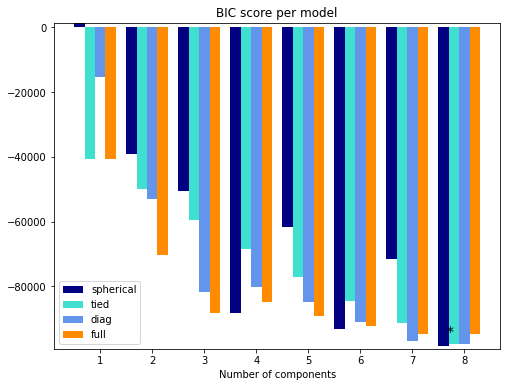

In [65]:
import numpy as np
import itertools

from scipy import linalg
import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn import mixture


X = z

lowest_bic = np.infty
bic = []
n_components_range = range(1, 9)
cv_types = ["spherical", "tied", "diag", "full"]
for cv_type in cv_types:
    for n_components in n_components_range:
        # Fit a Gaussian mixture with EM
        gmm = mixture.GaussianMixture(
            n_components=n_components, covariance_type=cv_type
        )
        gmm.fit(X)
        bic.append(gmm.bic(X))
        if bic[-1] < lowest_bic:
            lowest_bic = bic[-1]
            best_gmm = gmm

bic = np.array(bic)
color_iter = itertools.cycle(["navy", "turquoise", "cornflowerblue", "darkorange"])
clf = best_gmm
bars = []

# Plot the BIC scores
plt.figure(figsize=(8, 6))
# spl = plt.subplot(2, 1, 1)
for i, (cv_type, color) in enumerate(zip(cv_types, color_iter)):
    xpos = np.array(n_components_range) + 0.2 * (i - 2)
    bars.append(
        plt.bar(
            xpos,
            bic[i * len(n_components_range) : (i + 1) * len(n_components_range)],
            width=0.2,
            color=color,
        )
    )
plt.xticks(n_components_range)
plt.ylim([bic.min() * 1.01 - 0.01 * bic.max(), bic.max()])
plt.title("BIC score per model")
xpos = (
    np.mod(bic.argmin(), len(n_components_range))
    + 0.65
    + 0.2 * np.floor(bic.argmin() / len(n_components_range))
)
plt.text(xpos, bic.min() * 0.97 + 0.03 * bic.max(), "*", fontsize=14)
plt.xlabel("Number of components")
plt.legend([b[0] for b in bars], cv_types)

# # Plot the winner
# splot = plt.subplot(2, 1, 2)
# Y_ = clf.predict(X)
# for i, (mean, cov, color) in enumerate(zip(clf.means_, clf.covariances_, color_iter)):
#     v, w = linalg.eigh(cov)
#     if not np.any(Y_ == i):
#         continue
#     plt.scatter(X[Y_ == i, 0], X[Y_ == i, 1], 0.8, color=color)

#     # Plot an ellipse to show the Gaussian component
#     angle = np.arctan2(w[0][1], w[0][0])
#     angle = 180.0 * angle / np.pi  # convert to degrees
#     v = 2.0 * np.sqrt(2.0) * np.sqrt(v)
#     ell = mpl.patches.Ellipse(mean, v[0], v[1], 180.0 + angle, color=color)
#     ell.set_clip_box(splot.bbox)
#     ell.set_alpha(0.5)
#     splot.add_artist(ell)

# plt.xticks(())
# plt.yticks(())
# plt.title(
#     f"Selected GMM: {best_gmm.covariance_type} model, "
#     f"{best_gmm.n_components} components"
# )
# plt.subplots_adjust(hspace=0.35, bottom=0.02)
# plt.show()

In [68]:
Y_ = clf.predict(X)
t["group"] = Y_

In [72]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option("max_colwidth", None)
t.head()

,reasons,group
23,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_end_balance_usd ]",0
49,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_active_days_count ]",3
61,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_start_balance_usd ]",1
75,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_end_balance_usd ]",0
165,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_end_balance_usd ]",0


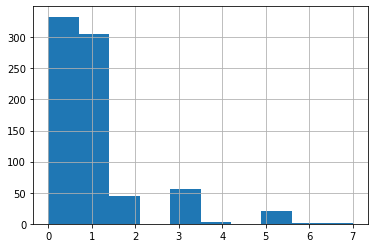

In [90]:
Tab = pd.pivot_table(t,)

In [87]:
p = pd.DataFrame(columns=t.columns)
for n in range(clf.n_components):
    p = p.append(t.loc[t["group"]==n].iloc[0], ignore_index=True)
p.to_csv("reasons.csv")

In [89]:
p.head(10)

,reasons,group
0,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_end_balance_usd ]",0
1,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_start_balance_usd ]",1
2,"[weekly_equity_rel_rt_positive_deposits , weekly_start_balance_usd , weekly_end_equity_usd ]",2
3,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_active_days_count ]",3
4,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , rt_deposits_count ]",4
5,"[weekly_equity_rel_rt_positive_deposits , weekly_end_equity_usd , weekly_active_days_count_rel_avg ]",5
6,"[weekly_equity_rel_rt_positive_deposits , weekly_active_days_count , weekly_end_balance_usd ]",6
7,"[weekly_equity_rel_rt_positive_deposits , weekly_end_balance_usd , weekly_end_equity_usd ]",7


In [8]:
df_mam = pd.read_csv("/home/mammoth/sandbox/Churn/tmp.csv")

In [10]:
df_mam = df_mam.join(df_from_sql2[["customer_gk","AI_model_probability"]].set_index("customer_gk"),
                     on="customer_gk",rsuffix="from_sql")
df_mam.head()

,Unnamed: 0,customer_gk,AI_model_probability,AI_model_probabilityfrom_sql
0,72,4680931,0.000319,0.000418
1,498,2006621,0.000082,0.000085
2,735,3078946,0.000517,0.000577
3,825,2955704,0.000212,0.000260
4,912,3727190,0.000438,0.000541


In [11]:
df_mam["diff"] = (df_mam["AI_model_probabilityfrom_sql"]-df_mam["AI_model_probability"])/

In [15]:
px.histogram(df_mam,"diff")

In [17]:
df_mam.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,24870.0,1.281777e+06,739123.963255,72.000000,6.434312e+05,1.285531e+06,1.920852e+06,2.560295e+06
customer_gk,24870.0,3.859278e+06,786454.571931,4816.000000,3.420868e+06,4.088280e+06,4.497536e+06,4.737131e+06
AI_model_probability,24870.0,3.129750e-02,0.134397,0.000057,9.886678e-05,1.457763e-04,6.354790e-04,9.608809e-01
AI_model_probabilityfrom_sql,24870.0,3.125186e-02,0.134390,0.000062,1.041900e-04,1.639798e-04,6.818116e-04,9.665424e-01
diff,24870.0,-4.564173e-05,0.003249,-0.076472,-5.197096e-07,8.407504e-06,3.327597e-05,6.261591e-02


In [44]:
df_from_sql2 = df_from_sql2.sort_values("trading_days")
df_from_sql2["is_vip"] = df_from_sql2["current_ltv"]>=2780
n = 10
Min_day = 355
Cond2 = df_from_sql2["trading_days"]>=Min_day

tmp_all_end_life = df_from_sql2[Cond2]
thresh = 0.5#tmp_all_end_life["top_10_probability"].quantile(0.9)
Cond1 = df_from_sql2["top_10_probability"]>thresh
tmp_high_end_life = df_from_sql2[Cond1&Cond2]
tmp_low_end_life = df_from_sql2[~Cond1&Cond2]

In [46]:
thresh = 2780
n_all = np.sum(tmp_all_end_life["current_ltv"]>thresh)
n_high = np.sum(tmp_high_end_life["current_ltv"]>thresh)
n_low = np.sum(tmp_low_end_life["current_ltv"]>thresh)

print("# of all customers : {}".format(np.sum(Cond2)))
print("# of all flagged customers : {}".format(tmp_high_end_life.shape[0]))
print("# of all vip customers : {}".format(n_all))
print("# of vip customers in vip flagged: {}".format(n_high))
print("# of vip customers in vip Not flaged: {}".format(n_low))

# of all customers : 1694
# of all flagged customers : 243
# of all vip customers : 178
# of vip customers in vip flagged: 83
# of vip customers in vip Not flaged: 95


In [102]:
tmp_all_end_life["is_vip"] = tmp_all_end_life["is_vip"].astype(float)
fig = px.histogram(tmp_all_end_life, x="top_10_probability", y="is_vip", histfunc='avg')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=1.0,
        size=0.1
    ))
fig.add_trace(go.Scatter(x=[0,1],y=[0.1,0.1],mode='lines',name="Normal VIP ratio"))
fig.add_trace(go.Scatter(x=[0.5,0.5],y=[min(fig.data[0].y),max(fig.data[0].y)],
                         mode='lines',name="decision line"))
fig.update_layout(yaxis=dict(range=[0,0.6]))
fig.show()

/home/mammoth/venv/avatrade/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [88]:
fig = px.histogram(tmp_all_end_life, x="top_10_probability", y="current_ltv", histfunc='avg')
fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=1.0,
        size=0.2
    ))
fig.add_trace(go.Scatter(x=[-0.025,1.025],y=[2780,2780],mode='lines',name="VIP threshold"))
fig.show()

In [92]:
fig = px.histogram(tmp_all_end_life, 
                   x="top_10_probability", y="current_ltv", 
                   histfunc="sum",histnorm="percent")
fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=1.0,
        size=0.2
    ))
fig.show()

In [91]:
fig = px.histogram(tmp_all_end_life, x="top_10_probability", histfunc="count")
fig.update_traces(xbins=dict( # bins used for histogram
        start=0.0,
        end=1.0,
        size=0.2
    ))
fig.show()

In [94]:
tmp_low_end_life.head()

,customer_id,top_10_probability,static_top_10_ltv,static_lower_90_ltv,dynamic_top_10_ltv,dynamic_lower_90_ltv,current_ltv,trading_days,insert_date,update_date,monitor,is_vip
4720,12073434,0.000034,11195.164699,607.640004,586.735116,587.023853,586.735118,355,2021-10-05 13:21:08.417,2021-10-10 18:15:40.970,None,False
3680,12049998,0.000014,12923.456884,470.945867,46.342544,46.893047,46.342544,355,2021-10-05 13:21:08.417,2021-10-10 18:15:40.970,None,False
3437,12046183,0.000000,14921.425496,348.437822,60.459646,61.059411,60.459646,355,2021-10-05 13:21:08.417,2021-10-10 18:15:40.970,None,False
4209,12063201,0.001149,5980.500095,430.009914,702.134739,698.450249,702.134739,355,2021-10-05 13:21:08.417,2021-10-10 18:15:40.970,None,False
3381,12044650,0.000008,12173.695321,488.739260,48.692084,49.181751,48.692084,355,2021-10-05 13:21:08.417,2021-10-10 18:15:40.970,None,False


In [100]:
target = "current_ltv"
checked = "dynamic_top_10_ltv"
(tmp_high_end_life[checked]-tmp_high_end_life[target]).sum()/tmp_high_end_life[target].sum()

0.00270752283505434

In [60]:
thresh = 0.4
above_thresh = df_from_sql2.loc[df_from_sql2["top_10_probability"]>=thresh,"current_ltv"].sum()
N_above = np.sum(df_from_sql2["top_10_probability"]>=thresh)
all_sum = df_from_sql2["current_ltv"].sum()
print("above threshold of {} there is {:.2f}% of ltv with {:.2f}% of population  "
      .format(thresh,above_thresh/all_sum*100,N_above/df_from_sql2.shape[0]*100))
thresh = 0.5
above_thresh = df_from_sql2.loc[df_from_sql2["top_10_probability"]>=thresh,"current_ltv"].sum()
N_above = np.sum(df_from_sql2["top_10_probability"]>=thresh)
all_sum = df_from_sql2["current_ltv"].sum()
print("above threshold of {} there is {:.2f}% of ltv with {:.2f}% of population  "
      .format(thresh,above_thresh/all_sum*100,N_above/df_from_sql2.shape[0]*100))

above threshold of 0.4 there is 71.58% of ltv with 28.28% of population  
above threshold of 0.5 there is 53.02% of ltv with 13.41% of population  


In [69]:
population_percent = []
ltv_percent = []
threshs = []
for thresh in np.arange(0,1.1,0.1):
    above_thresh = df_from_sql2.loc[df_from_sql2["top_10_probability"]>=thresh,"current_ltv"].sum()
    N_above = np.sum(df_from_sql2["top_10_probability"]>=thresh)
    all_sum = df_from_sql2["current_ltv"].sum()
    threshs.append(thresh)
    ltv_percent.append(above_thresh/all_sum*100)
    population_percent.append(N_above/df_from_sql2.shape[0]*100)


In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=threshs,y=ltv_percent,mode="markers",name = "ltv"))
fig.add_trace(go.Scatter(x=threshs,y=population_percent,mode="markers",name="population"))

In [174]:
df_from_sql2[df_from_sql2["current_ltv"]>2800].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_id,4315.0,1.250623e+07,3.020830e+05,1.203102e+07,1.224185e+07,1.248399e+07,1.274657e+07,1.321989e+07
top_10_probability,4315.0,5.352969e-01,4.157306e-01,0.000000e+00,1.921356e-04,4.999790e-01,1.000000e+00,1.000000e+00
static_top_10_ltv,4315.0,1.709230e+04,1.337939e+04,-3.019269e+03,1.097200e+04,1.493266e+04,1.897079e+04,2.533647e+05
static_lower_90_ltv,4315.0,5.992984e+02,1.813155e+02,3.084429e+02,4.243637e+02,5.827242e+02,7.587642e+02,9.154698e+02
dynamic_top_10_ltv,4315.0,1.049215e+05,1.645923e+06,2.813725e+03,4.916868e+03,8.266177e+03,1.690387e+04,4.928060e+07
dynamic_lower_90_ltv,4315.0,1.662337e+04,3.815780e+04,2.740584e+03,4.474495e+03,7.010216e+03,1.405203e+04,9.018279e+05
current_ltv,4315.0,1.497838e+04,3.412753e+04,2.802532e+03,4.017559e+03,6.344414e+03,1.286025e+04,7.032387e+05
trading_days,4315.0,2.236983e+02,8.371061e+01,2.000000e+00,1.660000e+02,2.340000e+02,2.920000e+02,3.630000e+02


In [175]:
df_from_sql2[df_from_sql2["current_ltv"]<2800].describe().T

,count,mean,std,min,25%,50%,75%,max
customer_id,49293.0,1.260710e+07,334378.584827,1.203097e+07,1.231331e+07,1.260265e+07,1.289192e+07,1.322561e+07
top_10_probability,49293.0,1.593806e-01,0.298673,0.000000e+00,0.000000e+00,0.000000e+00,1.284361e-01,1.000000e+00
static_top_10_ltv,49293.0,1.134186e+04,4315.736966,-2.300409e+03,8.576012e+03,1.035920e+04,1.354155e+04,9.821463e+04
static_lower_90_ltv,49293.0,4.487655e+02,118.533538,2.933284e+02,3.652368e+02,4.060591e+02,4.927039e+02,9.095385e+02
dynamic_top_10_ltv,49293.0,2.153538e+04,377252.851914,-7.619312e+06,4.407769e+01,1.505868e+02,5.728429e+02,2.148580e+07
dynamic_lower_90_ltv,49293.0,4.073974e+02,634.361717,-2.772896e+04,8.811942e+01,1.898500e+02,4.340857e+02,6.399563e+03
current_ltv,49293.0,3.141279e+02,570.852713,-2.881867e+04,2.816491e+01,9.796468e+01,3.448148e+02,2.798415e+03
trading_days,49293.0,1.881738e+02,97.490649,1.000000e+00,1.100000e+02,1.980000e+02,2.640000e+02,3.640000e+02


In [139]:
np.sum(tmp["current_ltv"]<2800)/np.sum(Cond2),np.sum(tmp["current_ltv"]>2800)/np.sum(Cond2)

(0.08267716535433071, 0.03543307086614173)

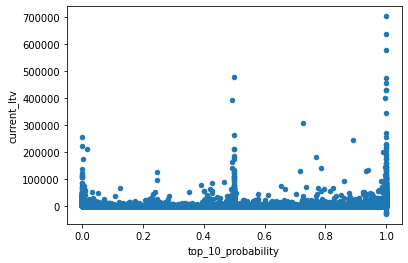

In [112]:
df_from_sql2.plot.scatter(x="top_10_probability",y="current_ltv")

In [101]:
key = "customer_id"
df = df_from_sql.join(df_from_sql2.set_index(key),on=key)

In [103]:
df = df.sort_values("top_10_probability",ascending=False)
df.head()

,customer_id,trading_days,static_ltv,dynamic_ltv,top_10_probability
17675,12197047,254,4298.141602,6300.506625,1.0
11962,12345131,244,26589.266937,666548.417523,1.0
31402,12234833,257,13571.986732,1863.301976,1.0
31397,13154202,16,9536.594594,71071.667596,1.0
37367,12246170,299,13456.433082,5459.922512,1.0


In [105]:
df["static_ltv"].std()

5827.436375373864

In [85]:
np.sum(df_from_sql.isna())

customer_id    0
prediction     0
max_day        0
dtype: int64

In [89]:
df_from_sql.shape[0]

63382

In [90]:
df_from_sql.loc[df_from_sql["customer_id"]==12587584]

,customer_id,prediction,max_day
42387,12587584,818.322998,167


In [88]:
df_upper_10 = pd.read_csv("/home/mammoth/sandbox/LTV/ARIMA_Pred.csv",index_col=0)
df_upper_10.head()

,customer_id,max_day,current_ltv,dynamic_upper_10_ltv_prediction
3,12777223,164,26.590000,27.794447
4,12594986,219,5.751842,6.943087
6,12291502,289,94.060337,99.309220
11,12882535,128,81.312038,200.363221
18,12268487,68,7674.130000,20422.403661


In [79]:
df_total = df_upper_10[["customer_id","current_ltv","dynamic_upper_10_ltv_prediction"]].join(df_from_sql.set_index("customer_id"),on="customer_id",how="inner")
df_total = df_total.rename({"prediction":"dynamic_lower_90_ltv_prediction"},axis = 1)

In [80]:
df_total.head(100)

,customer_id,current_ltv,dynamic_upper_10_ltv_prediction,dynamic_lower_90_ltv_prediction,max_day
3,12777223,26.590000,27.794447,1074.790039,110
4,12594986,5.751842,6.943087,824.359009,165
6,12291502,94.060337,99.309220,451.812988,235
11,12882535,81.312038,200.363221,848.901001,74
18,12268487,7674.130000,20422.403661,932.804016,14
21,12231056,21.049500,31.695439,377.467987,201
24,12428412,2.421380,2.964670,687.953979,201
25,12078461,62.010797,62.010797,206.167007,287
28,12587584,4.090202,5.007929,818.322998,167
29,12393744,78.083355,88.437253,503.776001,188


In [49]:
inspector = inspect(engine)
schemas = inspector.get_schema_names()

for schema in schemas:
    print("schema: %s" % schema)
    for table_name in inspector.get_table_names(schema=schema):
        try :
            print("schema is : {}, table name is : {}".format(table_name,schema))
            
        except MSSQLDatabaseException:
            pass
        except OperationalError:
            pass
            
#         for column in inspector.get_columns(table_name, schema=schema):
#             print("Column: %s" % column)

schema: db_accessadmin
schema: db_backupoperator
schema: db_datareader
schema: db_datawriter
schema: db_ddladmin
schema: db_denydatareader
schema: db_denydatawriter
schema: db_owner
schema: db_securityadmin
schema: dbo
schema is : 10PCTEmail, table name is : dbo
schema is : 10PCTEmail_v2, table name is : dbo
schema is : a, table name is : dbo
schema is : A_to_Z_contact, table name is : dbo
schema is : A_to_Z_cust, table name is : dbo
schema is : AccountDec, table name is : dbo
schema is : AD_States_Monitoring, table name is : dbo
schema is : Adroll_Data, table name is : dbo
schema is : adroll-data-2021-06-06, table name is : dbo
schema is : AdWords_CDN_clicks, table name is : dbo
schema is : AdWords_CDN_clicks_Inc, table name is : dbo
schema is : Affiliate_Monthly_Targets, table name is : dbo
schema is : Affiliate_Type, table name is : dbo
schema is : Affiliates_detailed_types, table name is : dbo
schema is : Affiliates2020, table name is : dbo
schema is : AffiliatesTargets2018, table 

OperationalError: (pymssql._pymssql.OperationalError) (911, b"Database 'dbo' does not exist. Make sure that the name is entered correctly.DB-Lib error message 20018, severity 16:\nGeneral SQL Server error: Check messages from the SQL Server\n")
[SQL: use dbo]
(Background on this error at: http://sqlalche.me/e/e3q8)

In [61]:
import plotly.express as px

px.scatter(df_total,x="prediction",y = "dynamic_upper_10_ltv_prediction")


In [81]:
np.sum(df_total.isna())

customer_id                        0
current_ltv                        0
dynamic_upper_10_ltv_prediction    0
dynamic_lower_90_ltv_prediction    0
max_day                            0
dtype: int64

In [91]:
df_total.loc[df_total["customer_id"]==12150876]

,customer_id,current_ltv,dynamic_upper_10_ltv_prediction,dynamic_lower_90_ltv_prediction,max_day
115,12150876,119.071821,119.071821,302.253998,270


In [81]:
df_is_top_10_probability=pd.read_csv("is_top_10_probability_pred.csv",index_col=0)

In [82]:
df_is_top_10_probability.head()

,customer_id,is_top_10_probability_static
10,12088494,0.000000
11,12181443,0.000000
12,12984352,0.000000
17,12218532,0.096162
18,12700869,0.965909


In [83]:
df_is_top_10_probability = df_is_top_10_probability.rename(columns={"is_top_10_probability_static":"top_10_probability"})

In [84]:
df_is_top_10_probability.tail()

,customer_id,top_10_probability
269048,12266800,0.000000
269049,12903428,0.000000
269055,12295391,0.763258
269056,12608647,0.013304
269058,12835705,0.000000


In [85]:
df_is_top_10_probability.shape

(53623, 2)

In [86]:
conn_string = 'mssql+pymssql://' + user + ':' + password + '@' + host + ':' + port + '/' + db
engine = create_engine(conn_string)
df_is_top_10_probability.to_sql(con=engine, name='ltv_vip_classification', index=False, if_exists='replace', chunksize=1000,
                                dtype={'customer_id': INTEGER(),
                                       'top_10_probability': FLOAT(),
                                       })

In [105]:
db =  "ava_bi_sources"
host =  "52.215.154.159"
port = "1433"
user =  "SmartBid"
password =  "GBd$$7014"
conn_string = 'mssql+pymssql://' + user + ':' + password + '@' + host + ':' + port + '/' + db
engine = create_engine(conn_string)
table = "ltv_vip_monitor"#"ltv_vip_classification"#"ltv_dynamic_prediction"#"ltv_top_10"#ltv_10_precent
df_from_sql3 = pd.read_sql(
    f"select top(100000) * from dbo."+table+" with(nolock) where top_10_probability is not null;",
    con=conn_string)

df_from_sql3.head(10)

,customer_id,top_10_probability,static_top_10_ltv,static_lower_90_ltv,dynamic_top_10_ltv,dynamic_lower_90_ltv,current_ltv,trading_days,insert_date
0,12836912,2.109200e-03,11836.154130,513.615990,452.288867,510.636949,451.108952,140,2021-10-10 04:00:00.440
1,12836925,0.000000e+00,14684.708722,376.683834,2386.797200,2487.020890,2239.052070,150,2021-10-06 09:37:42.893
2,12836925,1.609325e-05,12994.984429,376.683834,2386.637263,2469.933915,2239.052070,152,2021-10-10 04:00:00.440
3,12836933,0.000000e+00,10462.376976,398.668308,34.369409,88.119420,32.683820,146,2021-10-06 09:37:42.893
4,12836933,0.000000e+00,10104.043523,398.668308,34.369409,87.202197,32.683820,148,2021-10-10 04:00:00.440
5,12836942,4.999854e-01,19353.043964,514.276484,1058.062101,933.840522,642.261449,132,2021-10-06 09:37:42.893
6,12836942,4.985608e-01,17029.237422,514.276484,1034.977434,927.233048,645.341114,134,2021-10-10 04:00:00.440
7,12836991,0.000000e+00,9340.621345,345.087691,116.126481,142.684388,89.225000,151,2021-10-06 09:37:42.893
8,12836991,6.258488e-07,9171.560380,345.087691,116.125266,140.975312,89.225000,153,2021-10-10 04:00:00.440
9,12837012,1.072884e-06,9196.735607,354.149039,3.308967,112.704307,1.339660,74,2021-10-06 09:37:42.893


In [116]:
TAB = pd.pivot_table(df_from_sql3,
                     index="customer_id",
                     columns="insert_date", 
                     values=["top_10_probability","static_top_10_ltv",
                             "static_lower_90_ltv","current_ltv"], 
                     aggfunc=np.mean)

In [117]:
TAB.tail(100)

current_ltv                          \
insert_date 2021-10-06 09:37:42.893 2021-10-10 04:00:00.440   
customer_id                                                   
13070487                  57.804000               57.804000   
13070497                 848.060162             1392.830779   
13070499                1049.950000             1143.010000   
13070509                  65.500000               65.500000   
13070524                  72.910725               72.910725   
13070537                  98.759037              102.774310   
13070539                 168.410000              168.410000   
13070587                 111.426269              111.426269   
13070588                2694.300000             2857.500000   
13070601                   0.598213                0.598213   
13070640                 179.260000              179.260000   
13070646                 670.094108              779.477956   
13070662                  16.350000               16.350000   
13070666                  52.096430               52.096430   
13070682                 171.491824              171.491824   
13070686                 646.322199              672.314846   
13070703                  60.205329               60.205329   
13070712                 158.366489              158.366489   
13070755                   0.600000                0.600000   
13070789                   2.166578                2.166578   
13070794                  27.695868               27.695868   
13070810                  27.199828               27.199828   
13070813                 178.813811              178.813811   
13070830                 334.370315              334.370315   
13070854               16686.500000            17281.500000   
13070855                5544.041122             5901.586606   
13070856                 102.972818              102.972818   
13070879                  49.864162               49.864162   
13070881              223684.742681           223684.742681   
13070882                  96.175494               96.175494   
13070884                  11.982334               13.297234   
13070888                 384.866731              384.866731   
13070891                   5.306395                5.306395   
13070905                 469.815343              469.815343   
13070917                  82.481365               89.992465   
13070925                 547.374434              563.613983   
13070954                2868.230000             2919.270000   
13070969                 126.769261              126.769261   
13070988                 220.522253              220.522253   
13070999                 140.370000              155.910000   
13071005                2364.110000             2430.710000   
13071021                  88.150000               98.620000   
13071051                6689.625000             8224.000000   
13071057                  43.548641               43.548641   
13071106                 171.140000              171.140000   
13071125                   3.110401                3.110401   
13071130                  96.396792              100.296792   
13071162                  98.304496               98.304496   
13071171                1437.838901             1553.225795   
13071204                   2.280000                2.280000   
13071213                1672.989800             1702.090500   
13071240                1740.182708             1904.919488   
13071311                 174.101465              176.836163   
13071327                  63.058373               77.238373   
13071338                1144.382620             1144.382620   
13071351                 459.950000              493.240000   
13071417                 897.576793              897.576793   
13071446                  55.381194               55.381194   
13071467                   8.798007               11.305374   
13071471                  28.388600               28.388600   
13071494                 284.240000              284.24